In [1]:
msg = "hello i'm maybetuandat"
print(msg)

hello i'm maybetuandat


<>:6: SyntaxWarning: invalid escape sequence '\p'
<>:6: SyntaxWarning: invalid escape sequence '\p'
C:\Users\trinh\AppData\Local\Temp\ipykernel_1620\2626243864.py:6: SyntaxWarning: invalid escape sequence '\p'
  image = imread('images\parrot.png')


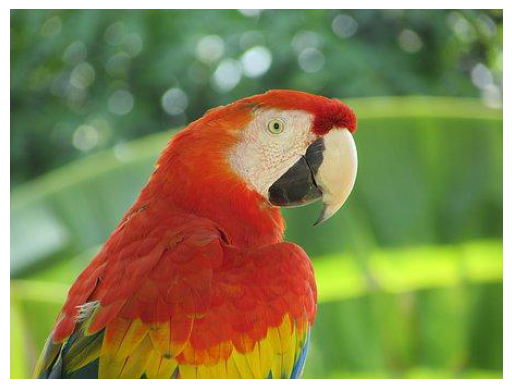

In [2]:
%matplotlib inline

import matplotlib.pyplot as plt
from skimage.io import imread

image = imread('images\parrot.png')  
plt.imshow(image)
plt.axis('off')  
plt.show()


<>:1: SyntaxWarning: invalid escape sequence '\h'
<>:1: SyntaxWarning: invalid escape sequence '\h'
C:\Users\trinh\AppData\Local\Temp\ipykernel_1620\1316319913.py:1: SyntaxWarning: invalid escape sequence '\h'
  img = imread('images\hill.png')


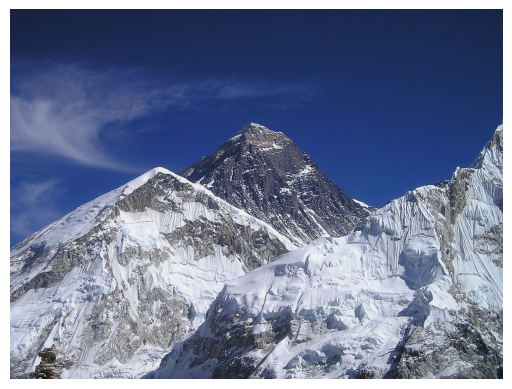

In [11]:
img = imread('images\hill.png')
#img[img < 0.5] = 0
plt.imshow(img)
plt.axis('off')  
plt.show()


<>:2: SyntaxWarning: invalid escape sequence '\l'
<>:2: SyntaxWarning: invalid escape sequence '\l'
C:\Users\trinh\AppData\Local\Temp\ipykernel_1620\3710515331.py:2: SyntaxWarning: invalid escape sequence '\l'
  im = mpimg.imread("images\lena_small.jpg") # read the image from disk as a numpy ndarray


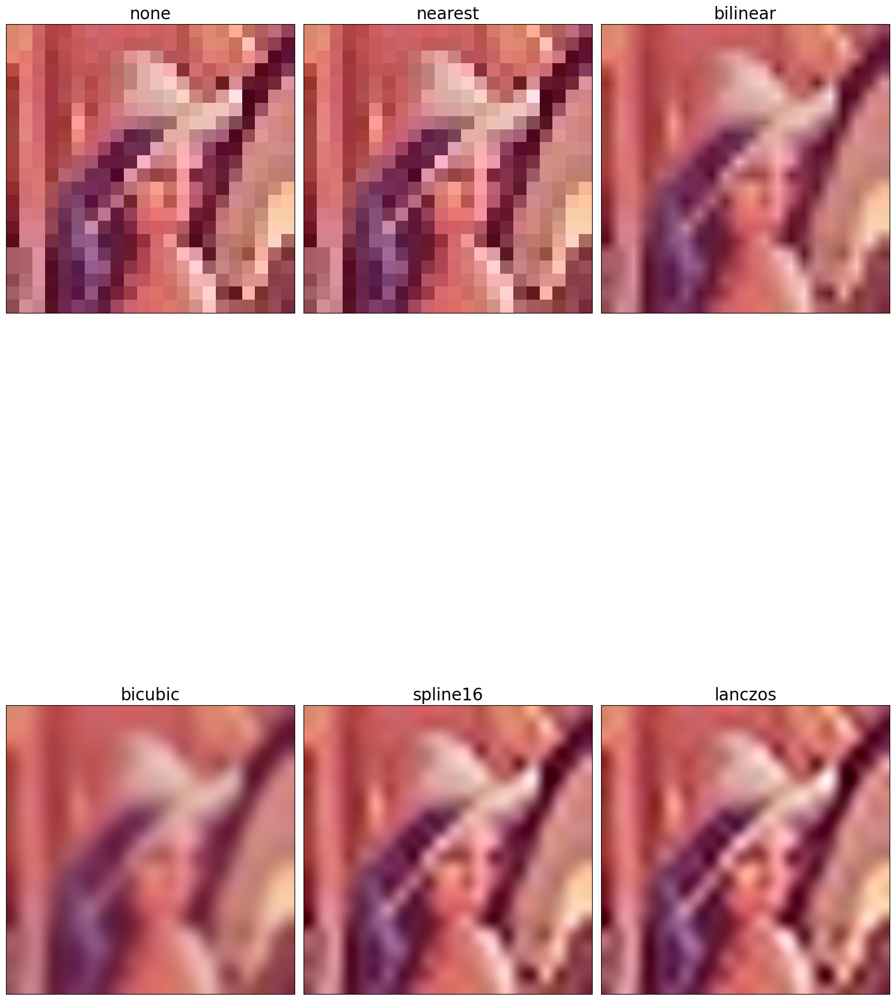

In [13]:
import matplotlib.image as mpimg
im = mpimg.imread("images\lena_small.jpg") # read the image from disk as a numpy ndarray
methods = ['none', 'nearest', 'bilinear', 'bicubic', 'spline16', 'lanczos']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 30),
 subplot_kw={'xticks': [], 'yticks': []})
fig.subplots_adjust(hspace=0.05, wspace=0.05)
for ax, interp_method in zip(axes.flat, methods):
 ax.imshow(im, interpolation=interp_method)
 ax.set_title(str(interp_method), size=20)
plt.tight_layout()
plt.show()


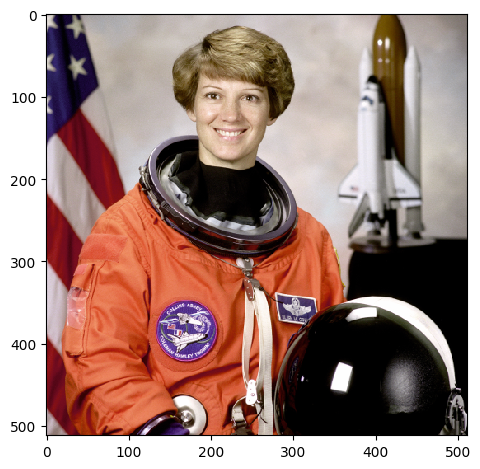

(<matplotlib.image.AxesImage at 0x210ff7372f0>, None)

In [16]:
from skimage import data
from skimage.io import imread, imsave, imshow, show, imread_collection,imshow_collection
im = data.astronaut()
imshow(im), show()


C:\Users\trinh\AppData\Local\Temp\ipykernel_1620\3728696817.py:2: DeprecationWarning: scipy.misc.face has been deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. Dataset methods have moved into the scipy.datasets module. Use scipy.datasets.face instead.
  im = misc.face() # load the raccoon's face image


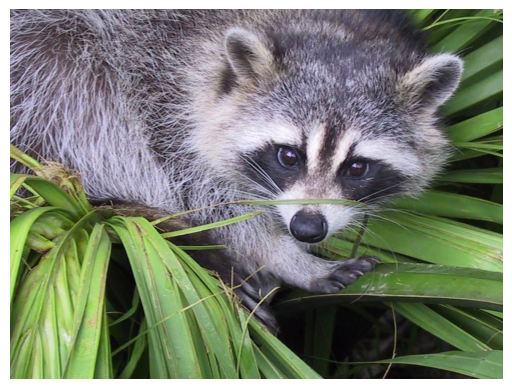

(<matplotlib.image.AxesImage at 0x210ff6511c0>,
 (-0.5, 1023.5, 767.5, -0.5),
 None)

In [19]:
from scipy import misc
im = misc.face() # load the raccoon's face image
#misc.imsave('face.png', im) # uses the Image module (PIL)
plt.imshow(im), plt.axis('off'), plt.show()



Use python library to convert from one file format to another

In [25]:
from PIL import Image
im = Image.open('images\parrot.png')
print(im.mode)
im.save("images.jpg")


RGB


<>:2: SyntaxWarning: invalid escape sequence '\p'
<>:2: SyntaxWarning: invalid escape sequence '\p'
C:\Users\trinh\AppData\Local\Temp\ipykernel_1620\1543389835.py:2: SyntaxWarning: invalid escape sequence '\p'
  im = Image.open('images\parrot.png')


if the image file is rgba, you must have to convert it to rgb  before save it in jpa

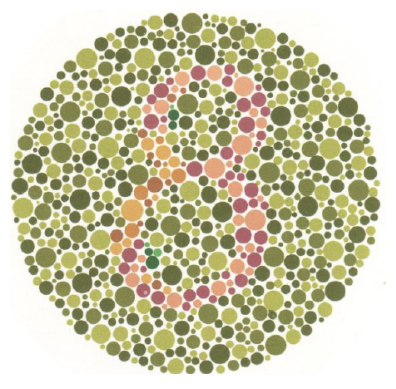

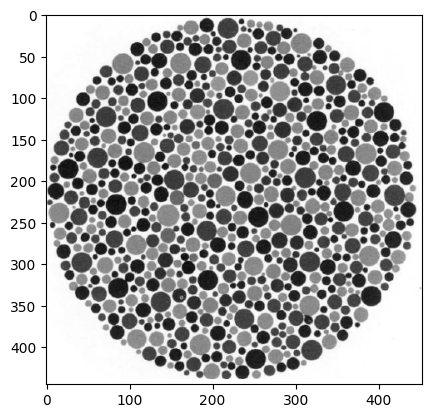

In [38]:
from skimage import color
img = imread('images/Ishihara.png')
img_hehe = color.rgb2gray(img)
plt.imshow(img)
plt.axis('off')
plt.show()
plt.imshow(img_hehe, cmap='gray')

Converting image data  structures

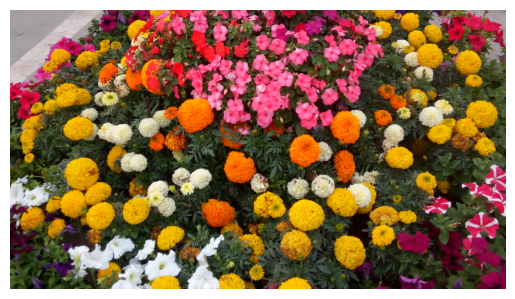

In [40]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

im = Image.open("images/flowers.png")
im = np.array(im)

plt.imshow(im)
plt.axis('off')
plt.show()


In [41]:
im = imread('images/flowers.png')
im = Image.fromarray(im) 
im.show() 

Basic image manipulations


Use numpy array slicing 

[180  76  83]


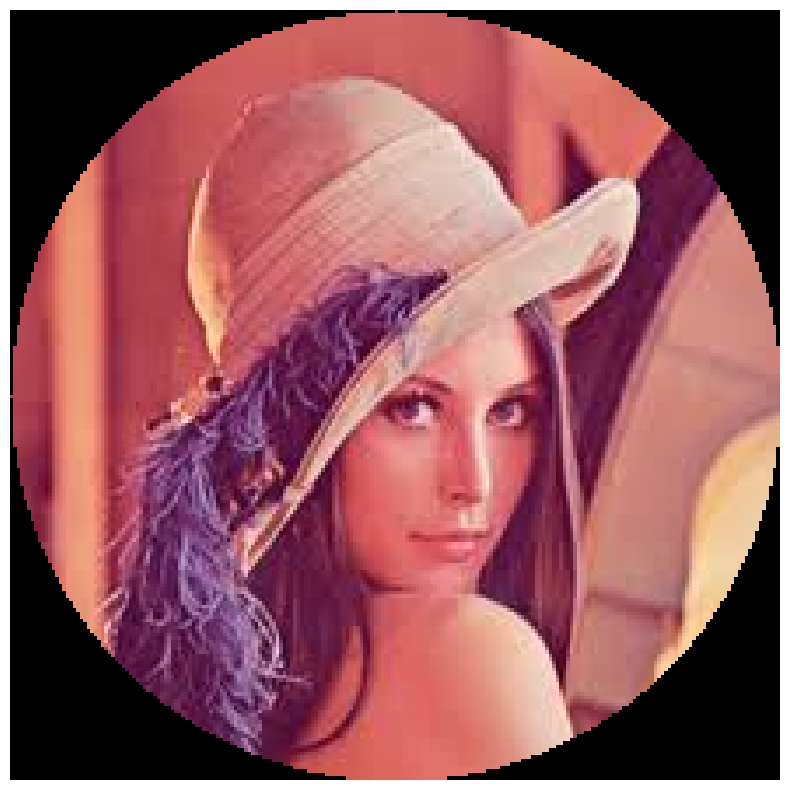

In [45]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the image
lena = mpimg.imread("images/lena.jpg")  # Read the image from disk
lena = np.array(lena, copy=True)  # Create a writable copy

# Print a specific pixel value
print(lena[0, 40])

# Get the dimensions of the image
lx, ly, _ = lena.shape

# Create a circular mask
X, Y = np.ogrid[0:lx, 0:ly]
mask = (X - lx / 2) ** 2 + (Y - ly / 2) ** 2 > lx * ly / 4
lena[mask, :] = 0  # Apply the mask to set pixels outside the circle to black

# Display the modified image
plt.figure(figsize=(10, 10))
plt.imshow(lena)
plt.axis('off')
plt.show()


simple image morphing

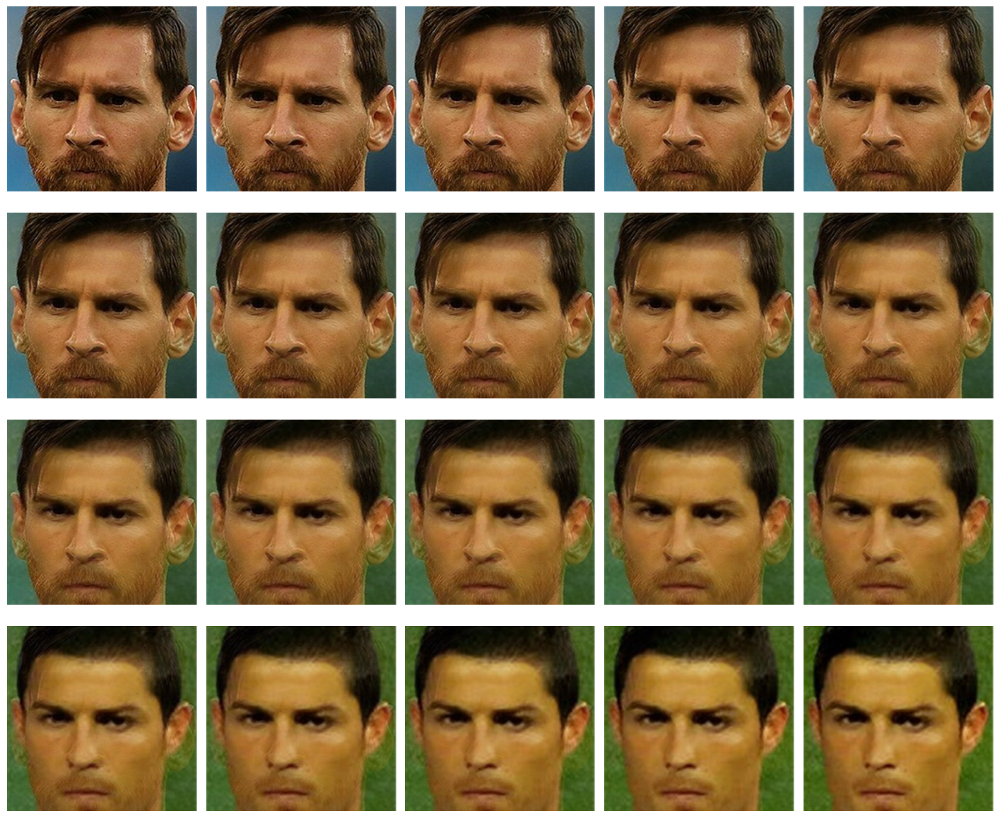

In [46]:
im1 = mpimg.imread("images/messi.jpg") / 255 # scale RGB values in [0,1]
im2 = mpimg.imread("images/ronaldo.jpg") / 255
i = 1
plt.figure(figsize=(18,15))
for alpha in np.linspace(0,1,20):
 plt.subplot(4,5,i)
 plt.imshow((1-alpha)*im1 + alpha*im2)
 plt.axis('off')
 i += 1
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()


Use Image manipulations with PIL


Crop image


In [51]:
im = Image.open("images/parrot.png") # open the image, provide
print(im.width, im.height, im.mode, im.format) 
im_c = im.crop((175,75,320,200)) 
im_c.show()

453 340 RGB PNG


Resize image

In [54]:
im = Image.open("images/clock.jpg")
print(im.width, im.height)
# 107 105
im_large = im.resize((im.width*5, im.height*5), Image.BILINEAR)
im_large.show()
print(im_large.width, im_large.height)

107 105
535 525


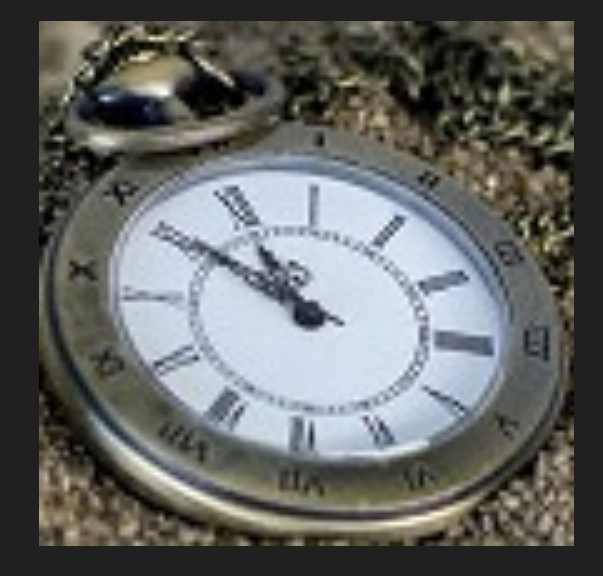

Negating image


In [55]:
im = Image.open("images/parrot.png")
im_t = im.point(lambda x: 255 - x)
im_t.show()


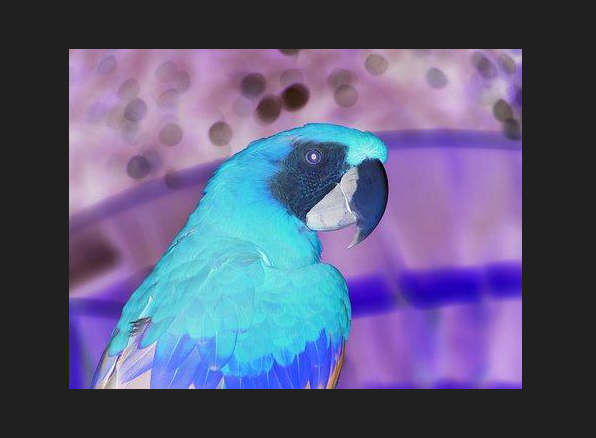

Rotating image

In [56]:
im_45 = im.rotate(45) # rotate the image by 45 degrees
im_45.show() 

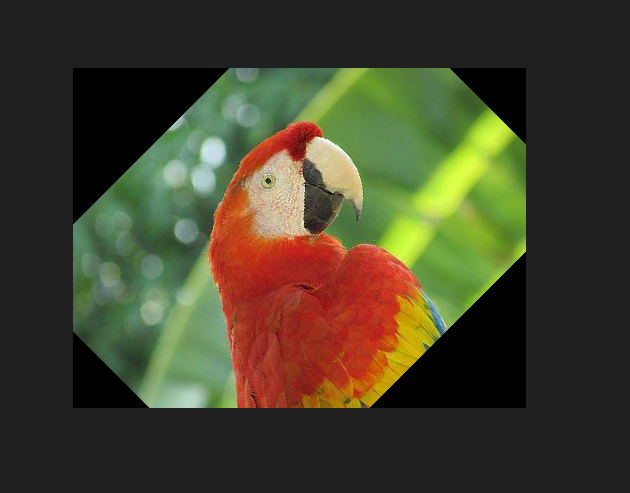

Drawing on an image

In [57]:
from PIL import Image, ImageFont, ImageDraw
im = Image.open("images/parrot.png")
draw = ImageDraw.Draw(im)
draw.ellipse((125, 125, 200, 250), fill=(255,255,255,128))
del draw
im.show()

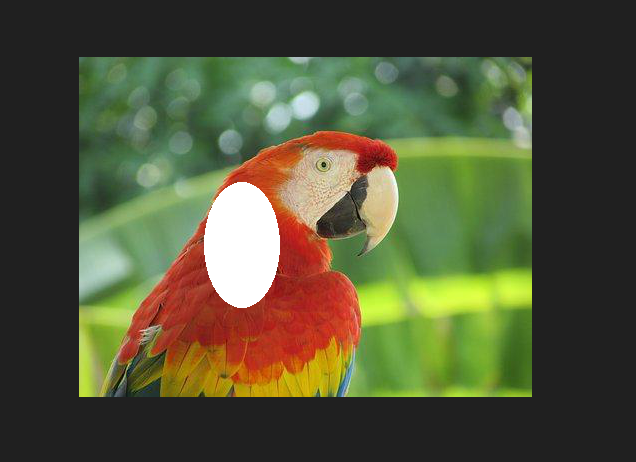

Image manipulations with scikit-image

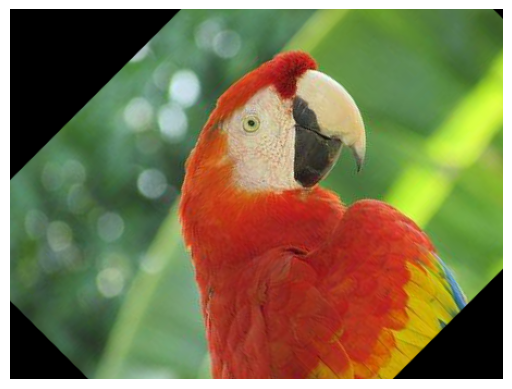

(<matplotlib.image.AxesImage at 0x2d1cd17e360>,
 (-0.5, 452.5, 339.5, -0.5),
 None)

In [4]:
from skimage.transform import SimilarityTransform, warp, swirl
from skimage.io import imread
import numpy as np
im = imread("images/parrot.png")
tform = SimilarityTransform(scale=0.9,
rotation=np.pi/4,translation=(im.shape[0]/2, -100))
warped = warp(im, tform)
import matplotlib.pyplot as plt
plt.imshow(warped), plt.axis('off'), plt.show()

Swirl transform

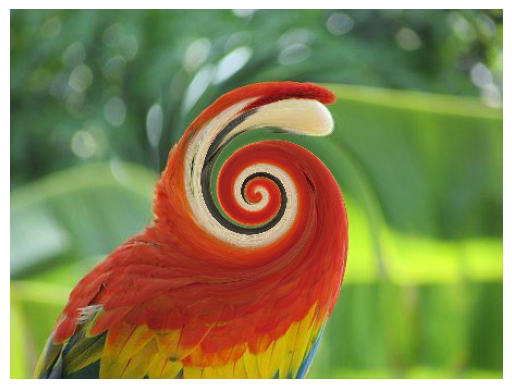

In [6]:
im = imread("images/parrot.png")
swirled = swirl(im, rotation=0, strength=15, radius=200)
plt.imshow(swirled)
plt.axis('off')
plt.show()

Image manipulation with Matplotlib

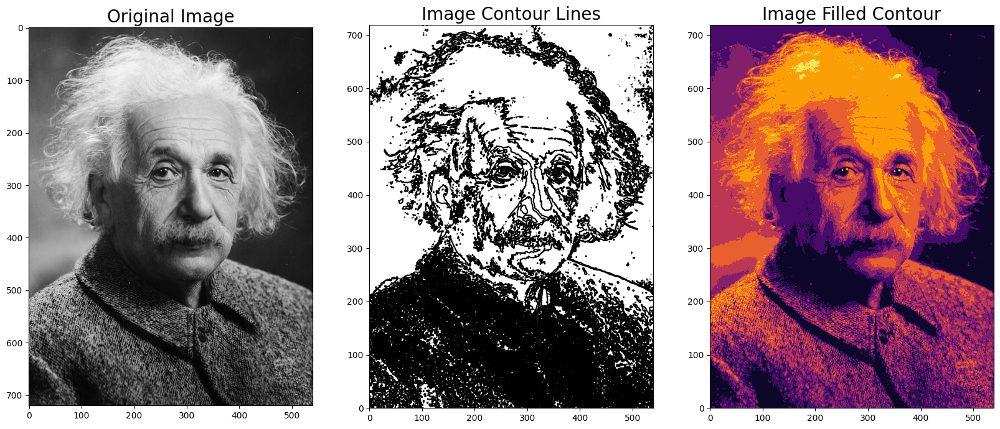

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color

# Read the image from disk
im = io.imread("images/einstein.jpg")

# Check if the image is already grayscale
if im.ndim == 2:  # Grayscale image
    gray_im = im
else:  # RGB image
    gray_im = color.rgb2gray(im)

# Set up the figure
plt.figure(figsize=(20, 8))

# Display the original image
plt.subplot(131)
plt.imshow(gray_im, cmap='gray')
plt.title('Original Image', size=20)

# Display contour lines
plt.subplot(132)
plt.contour(np.flipud(gray_im), colors='k', levels=np.logspace(-15, 15, 100))
plt.title('Image Contour Lines', size=20)

# Display filled contours
plt.subplot(133)
plt.contourf(np.flipud(gray_im), cmap='inferno')
plt.title('Image Filled Contour', size=20)

# Show the plots
plt.show()


Code and explain

    Create a Python remake of the Gotham Instagram filter

In [ ]:
from PIL import Image, ImageEnhance
import numpy as np

def apply_gotham_filter(image_path):
    
    img = Image.open(image_path).convert("RGB")
    r, g, b = img.split()

    
    
    r = np.array(r)
    r = np.interp(r, [0, 50, 255], [0, 80, 255]).astype(np.uint8)
    r = Image.fromarray(r)

    
    b = ImageEnhance.Brightness(b).enhance(1.2)

    
    gotham_img = Image.merge("RGB", (r, g, b))
    enhancer = ImageEnhance.Sharpness(gotham_img)
    gotham_img = enhancer.enhance(1.3)
    return gotham_img
image_path = "image.png"  # Đường dẫn đến ảnh gốc
gotham_img = apply_gotham_filter(image_path)
gotham_img.show()
gotham_img.save("gotham_filtered_image.jpg")


# Tạo hiệu ứng Gotham tương tự filter của Instagram

Để tạo hiệu ứng Gotham, chúng ta cần thực hiện các bước sau:

1. **Chuyển đổi ảnh sang RGB**
   - Mở ảnh và chuyển đổi sang hệ màu RGB để dễ dàng thao tác với từng kênh màu (Red, Green, Blue).
   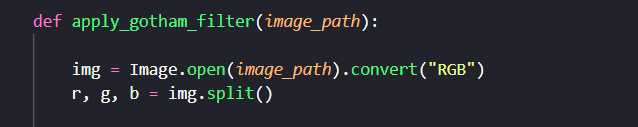
  
2. **Tăng cường kênh sáng màu xanh dương**
   - Điều chỉnh độ sáng của kênh màu xanh dương để tạo sắc lạnh.
   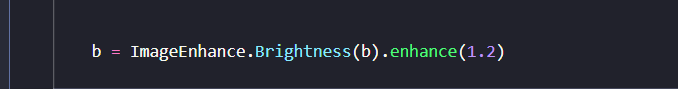
  
3. **Tăng cường độ tương phản của kênh đỏ**
   - Sử dụng phương pháp nội suy (interpolation) để điều chỉnh kênh màu đỏ , tăng độ tương phản, làm cho các chi tiết nổi bật.
   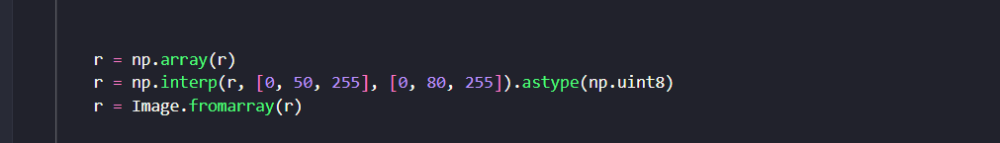

4. **Gộp các kênh và làm sắc nét ảnh**
   - Kết hợp các kênh màu đã chỉnh sửa lại, sau đó làm sắc nét để tạo hiệu ứng nổi bật, tăng chiều sâu cho ảnh.
   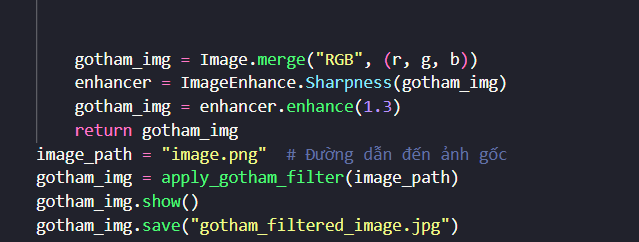


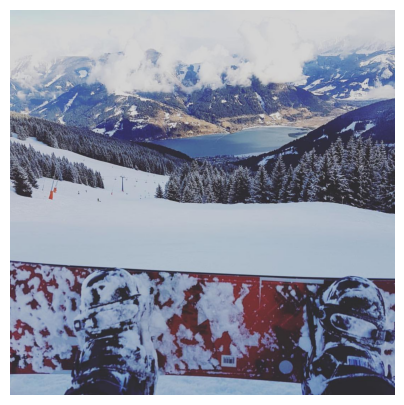

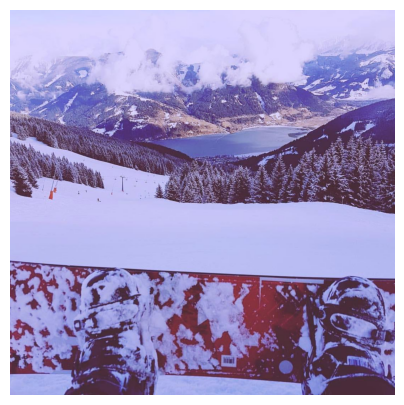

In [5]:
import matplotlib.pyplot as plt
plt.figure(figsize=(5, 5))

img_old = Image.open("image.png")
plt.imshow(img_old)
plt.axis('off')
plt.show()
img_new = Image.open("gotham_filtered_image.jpg")
plt.figure(figsize=(5, 5))
plt.imshow(img_new)
plt.axis('off')

plt.show()